# Predictive Modelling and Model Comparision

In [2]:
# BEGIN SOLUTION
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv("./data/melb_data.csv")
print("data shape: " , data.shape)
print("columns: ", data.columns)
# END SOLUTION

data shape:  (13580, 21)
columns:  Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')


In [3]:
data.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

In [5]:
# BEGIN SOLUTION

from pandas_profiling import ProfileReport

ProfileReport(data)

# END SOLUTION

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

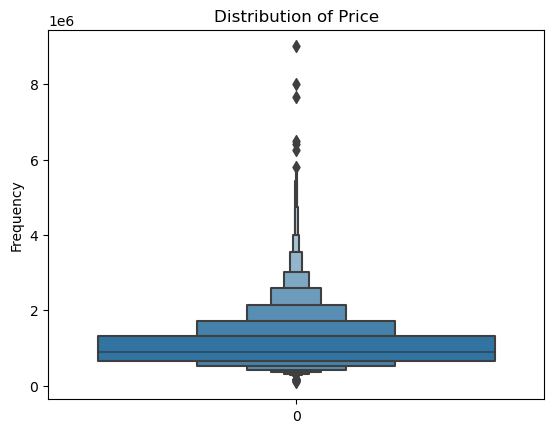

In [6]:
# BEGIN SOLUTION

import seaborn as sns
from matplotlib import style
%matplotlib inline

sns.boxenplot(data['Price'])
plt.title('Distribution of Price')
plt.ylabel('Frequency')
plt.show()

# END SOLUTION

In [7]:
print(len(data[data['Price'] >= 3500000])) #or 4000000
data[data['Price'] >= 3500000].head()

114


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
108,Albert Park,115 Page St,4,h,4735000.0,S,Marshall,25/02/2017,3.3,3206.0,...,2.0,1.0,330.0,207.0,1910.0,Port Phillip,-37.8477,144.9558,Southern Metropolitan,3280.0
112,Albert Park,22 Greig St,3,h,3755000.0,S,Greg,26/07/2016,3.3,3206.0,...,2.0,2.0,325.0,NaN,NaN,Port Phillip,-37.8413,144.9500,Southern Metropolitan,3280.0
233,Armadale,11/17 Myamyn St,2,u,3625000.0,S,Jellis,4/06/2016,6.3,3143.0,...,2.0,2.0,0.0,NaN,2006.0,Stonnington,-37.8555,145.0291,Southern Metropolitan,4836.0
251,Armadale,367 Dandenong Rd,6,h,5525000.0,S,Marshall,17/09/2016,6.3,3143.0,...,3.0,4.0,1491.0,516.0,1935.0,Stonnington,-37.8602,145.0130,Southern Metropolitan,4836.0
270,Armadale,61 Union St,4,h,3660000.0,S,Jellis,25/02/2017,6.3,3143.0,...,3.0,2.0,421.0,NaN,NaN,Stonnington,-37.8593,145.0275,Southern Metropolitan,4836.0


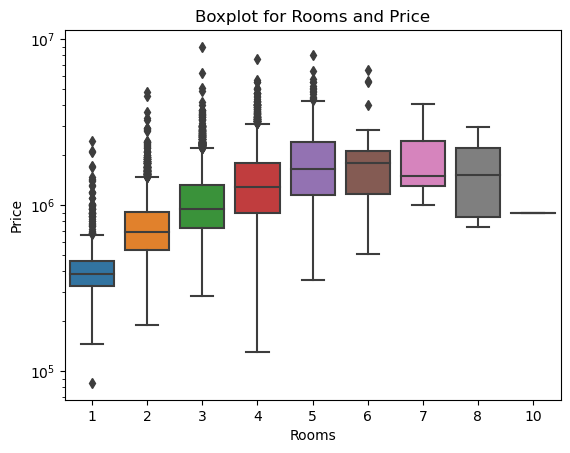

In [8]:
#box plot for rooms and price, log scale used for better interpretation
sns.boxplot(data=data, x="Rooms", y="Price")
plt.title('Boxplot for Rooms and Price')
plt.yscale('log')

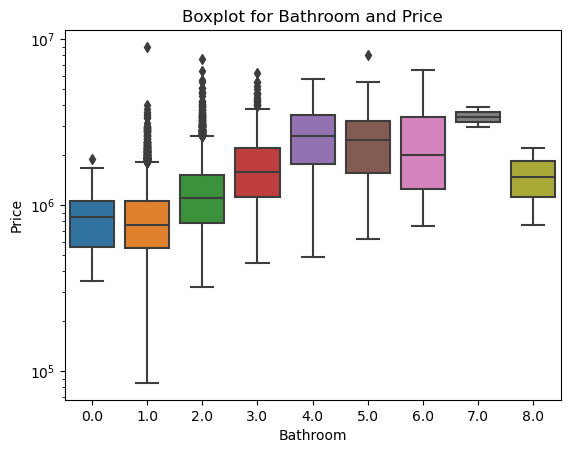

In [9]:
#box plot for Bathroom and price, log scale used for better interpretation
sns.boxplot(data=data, x="Bathroom", y="Price")
plt.title('Boxplot for Bathroom and Price')
plt.yscale('log')

In [10]:
#setting boundaries for building area and price to drop outliers
# 64 or 114 data out of 13580 is 0.47% and 0.84%, so it is reasonable 
# to drop these data points 
print(len(data[data['BuildingArea'] >= 500])) 
print(len(data[data['Price'] >= 3500000])) 
data_new = data.loc[data['BuildingArea'] <= 500]
data_new2 = data_new.loc[data['Price'] <= 3500000]

64
114


Text(0.5, 1.0, 'Relationship of Price and BuildingArea for Rooms')

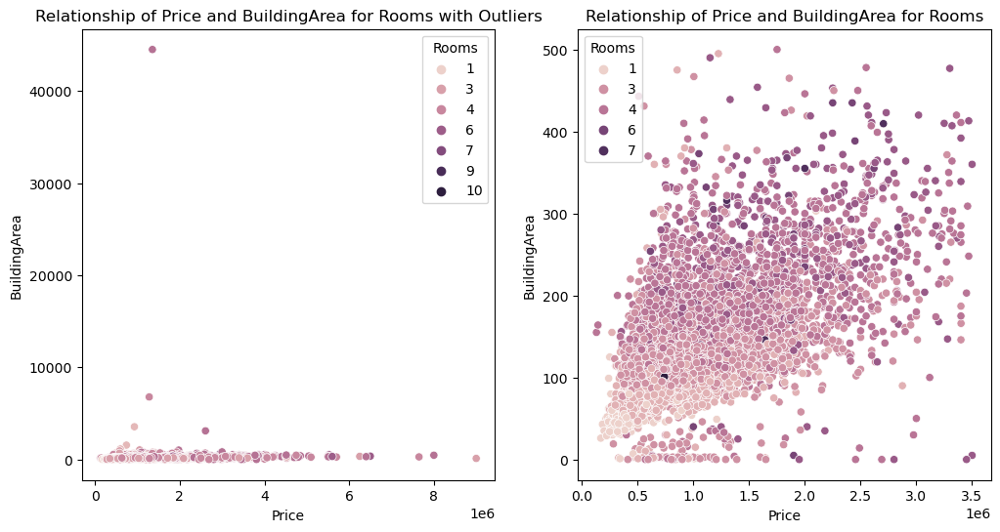

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

#plot with original data
#plot with outlier, the range of building area is too big 
#visual representation of graph is not appropriate 
sns.scatterplot(data=data, x="Price", y="BuildingArea", hue="Rooms", ax=axes[0])
axes[0].set_title('Relationship of Price and BuildingArea for Rooms with Outliers')

#plot with data_new2
#using data with restrction (building area >= 500 and price >= 3500000)
#more understable visual representation 
sns.scatterplot(data=data_new2, x="Price", y="BuildingArea", hue="Rooms", ax=axes[1])
axes[1].set_title('Relationship of Price and BuildingArea for Rooms')

In [12]:
# BEGIN SOLUTION

from sklearn.model_selection import train_test_split, KFold

X = data.loc[:, data.columns !='Price']
y = data['Price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state =42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

X_train.head()

# END SOLUTION

,Suburb,Address,Rooms,Type,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
12796,Mount Waverley,37 Pascall St,4,h,S,Jellis,16/09/2017,14.2,3149.0,4.0,2.0,2.0,695.0,160.0,1970.0,NaN,-37.86127,145.14271,Eastern Metropolitan,13366.0
9642,Mount Waverley,23 Baily St,3,h,S,Ray,17/06/2017,14.2,3149.0,3.0,1.0,2.0,810.0,NaN,NaN,Monash,-37.86838,145.14664,Eastern Metropolitan,13366.0
3207,Hawthorn,5/70 Power St,2,u,S,Jellis,25/02/2017,4.6,3122.0,2.0,1.0,1.0,82.0,NaN,NaN,Boroondara,-37.81800,145.02680,Southern Metropolitan,11308.0
1698,Carlton North,24/635 Drummond St,2,u,S,hockingstuart,27/06/2016,3.2,3054.0,2.0,1.0,1.0,0.0,76.0,1975.0,Yarra,-37.79020,144.97000,Northern Metropolitan,3106.0
761,Bentleigh,3 Somers St,4,h,S,Woodards,22/05/2016,13.0,3204.0,4.0,2.0,1.0,292.0,NaN,NaN,Glen Eira,-37.91480,145.02430,Southern Metropolitan,6795.0


In [13]:
# BEGIN SOLUTION
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder

np.random.seed(42)

cat_cols = ['CouncilArea','Regionname','Method'] 
cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
])

# END SOLUTION

In [14]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler

num_cols = ['Rooms', 'Bathroom','BuildingArea','Postcode','Distance']

num_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors = 5)),
    ('scaler', RobustScaler())
])

num_transformer


Pipeline(steps=[('imputer', KNNImputer()), ('scaler', RobustScaler())])

In [15]:
from sklearn.compose import ColumnTransformer

preprocessor = ColumnTransformer(
    transformers=[
         ('num', num_transformer, num_cols),
        ('cat', cat_transformer, cat_cols)
    ])

### Problem 2.2: Perform Linear Regression

Perform Linear Regression on training data. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [16]:
# BEGIN SOLUTION

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

linearModel = LinearRegression()

linearPipeline = Pipeline(steps=[
    ('linearRegression', preprocessor),
    ('linearModel', linearModel)
])
                                 
y_true = data['Price']
y_pred = linearPipeline.fit(X_train, y_train).predict(X_test)


LinearScore = (str)(linearPipeline.score(X_test, y_test))
LinearRMSE = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("rmse: ", LinearRMSE)
print("r2: ", LinearScore)

# END SOLUTION

/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


rmse:  175200591413.1123
r2:  0.5589262820851943


In [17]:
# BEGIN SOLUTION

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

KNNModel = KNeighborsRegressor()

KNearest = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('KNNModel', KNNModel)
])

y_pred = KNearest.fit(X_train, y_train).predict(X_test)

num_transformer_grid = {'preprocessor__num__imputer__n_neighbors': [3, 5, 7]}

gridSearch = GridSearchCV(KNearest, param_grid = num_transformer_grid)

gridSearch.fit(X_train, y_train)

newKNNModel = KNeighborsRegressor(n_neighbors = gridSearch.best_params_['preprocessor__num__imputer__n_neighbors'])

newPipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('newPipeline', KNNModel)
])

y_pred = newPipeline.fit(X_train, y_train).predict(X_test)

KNNr2 = (str)(newPipeline.score(X_test, y_test))
KNNrmse = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("rmse: ", KNNrmse)
print("r2: ", KNNr2)

# END SOLUTION

/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: Fu

rmse:  138039592594.7481
r2:  0.6524804178220722


In [18]:
# BEGIN SOLUTION

from sklearn.tree import DecisionTreeRegressor
from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import StandardScaler

dt_regressor = DecisionTreeRegressor()

dt_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('dt_regressor', dt_regressor)
])


param_grid = {'dt_regressor__max_depth': [None, 5, 10, 15]} 


grid_search = GridSearchCV(dt_pipeline, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)


best_dt_pipeline = grid_search.best_estimator_


y_pred = best_dt_pipeline.predict(X_test)


dt_r2 = (str)(best_dt_pipeline.score(X_test, y_test))
dt_rmse = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("r^2 ", dt_r2)
print("rmse: ", dt_rmse)

# END SOLUTION


/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: Fu

r^2  0.6033707949000068
rmse:  157546615186.56506


In [19]:
# BEGIN SOLUTION
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor

rf_regressor = RandomForestRegressor()


rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('rf_regressor', rf_regressor)
])

param_grid = {'rf_regressor__n_estimators': [50, 100, 150]}  


grid_search = GridSearchCV(rf_pipeline, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)


best_rf_pipeline = grid_search.best_estimator_

y_pred = best_rf_pipeline.predict(X_test)

rf_r2 = r2_score(y_test, y_pred)
rf_rmse = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("rsme: ", rf_rmse)
print("r^2: ", rf_r2)

# END SOLUTION

/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: Fu

rsme:  125510328402.49384
r^2:  0.6840232858879893


In [20]:
featureSelection = ['Price','CouncilArea', 'Type','Regionname','Method', 
'Rooms', 'Bathroom','BuildingArea','Postcode','Distance','Car']
data = data[featureSelection]
data.head()

,Price,CouncilArea,Type,Regionname,Method,Rooms,Bathroom,BuildingArea,Postcode,Distance,Car
0,1480000.0,Yarra,h,Northern Metropolitan,S,2,1.0,NaN,3067.0,2.5,1.0
1,1035000.0,Yarra,h,Northern Metropolitan,S,2,1.0,79.0,3067.0,2.5,0.0
2,1465000.0,Yarra,h,Northern Metropolitan,SP,3,2.0,150.0,3067.0,2.5,0.0
3,850000.0,Yarra,h,Northern Metropolitan,PI,3,2.0,NaN,3067.0,2.5,1.0
4,1600000.0,Yarra,h,Northern Metropolitan,VB,4,1.0,142.0,3067.0,2.5,2.0


In [21]:
#new feature 1
#new column called 'total rooms' that is combination of number of
#rooms and bathrooms

data['totalRooms'] = data['Rooms'] + data['Bathroom']
data.drop(['Rooms', 'Bathroom'], axis=1, inplace=True)

data.head()

/var/folders/8f/rjv9ttbj2v35mh7wbvmnd6340000gn/T/ipykernel_6839/67707606.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['totalRooms'] = data['Rooms'] + data['Bathroom']
/var/folders/8f/rjv9ttbj2v35mh7wbvmnd6340000gn/T/ipykernel_6839/67707606.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop(['Rooms', 'Bathroom'], axis=1, inplace=True)


,Price,CouncilArea,Type,Regionname,Method,BuildingArea,Postcode,Distance,Car,totalRooms
0,1480000.0,Yarra,h,Northern Metropolitan,S,NaN,3067.0,2.5,1.0,3.0
1,1035000.0,Yarra,h,Northern Metropolitan,S,79.0,3067.0,2.5,0.0,3.0
2,1465000.0,Yarra,h,Northern Metropolitan,SP,150.0,3067.0,2.5,0.0,5.0
3,850000.0,Yarra,h,Northern Metropolitan,PI,NaN,3067.0,2.5,1.0,5.0
4,1600000.0,Yarra,h,Northern Metropolitan,VB,142.0,3067.0,2.5,2.0,5.0


In [22]:
#new feature 2
#new column called 'method_sold' is for data point with method sold  

data['method_sold'] = (data['Method'] == 'S').astype(int)

data.head()

/var/folders/8f/rjv9ttbj2v35mh7wbvmnd6340000gn/T/ipykernel_6839/988854498.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['method_sold'] = (data['Method'] == 'S').astype(int)


,Price,CouncilArea,Type,Regionname,Method,BuildingArea,Postcode,Distance,Car,totalRooms,method_sold
0,1480000.0,Yarra,h,Northern Metropolitan,S,NaN,3067.0,2.5,1.0,3.0,1
1,1035000.0,Yarra,h,Northern Metropolitan,S,79.0,3067.0,2.5,0.0,3.0,1
2,1465000.0,Yarra,h,Northern Metropolitan,SP,150.0,3067.0,2.5,0.0,5.0,0
3,850000.0,Yarra,h,Northern Metropolitan,PI,NaN,3067.0,2.5,1.0,5.0,0
4,1600000.0,Yarra,h,Northern Metropolitan,VB,142.0,3067.0,2.5,2.0,5.0,0


In [23]:
#resplit data
X = data.loc[:, data.columns !='Price']
y = data['Price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state =42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

X_train.head()

,CouncilArea,Type,Regionname,Method,BuildingArea,Postcode,Distance,Car,totalRooms,method_sold
12796,NaN,h,Eastern Metropolitan,S,160.0,3149.0,14.2,2.0,6.0,1
9642,Monash,h,Eastern Metropolitan,S,NaN,3149.0,14.2,2.0,4.0,1
3207,Boroondara,u,Southern Metropolitan,S,NaN,3122.0,4.6,1.0,3.0,1
1698,Yarra,u,Northern Metropolitan,S,76.0,3054.0,3.2,1.0,3.0,1
761,Glen Eira,h,Southern Metropolitan,S,NaN,3204.0,13.0,1.0,6.0,1


In [24]:
np.random.seed(42)

cat_cols = ['CouncilArea','Regionname','method_sold','Type','Method'] 
cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
])

In [25]:
num_cols = ['BuildingArea','totalRooms','Distance','Postcode','Car']

num_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors = 5)),
    ('scaler', RobustScaler())
])

num_transformer

Pipeline(steps=[('imputer', KNNImputer()), ('scaler', RobustScaler())])

In [26]:
preprocessor = ColumnTransformer(
    transformers=[
         ('num', num_transformer, num_cols),
        ('cat', cat_transformer, cat_cols)
    ])

In [27]:
linearModel = LinearRegression()

linearPipeline = Pipeline(steps=[
    ('linearRegression', preprocessor),
    ('linearModel', linearModel)
])
                                 
y_true = data['Price']
y_pred = linearPipeline.fit(X_train, y_train).predict(X_test)


LinearScore_new = (str)(linearPipeline.score(X_test, y_test))
LinearRMSE_new = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("rmse: ", LinearScore_new)
print("r2: ", LinearScore_new)

/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


rmse:  0.6392510731215082
r2:  0.6392510731215082


In [28]:
KNNModel = KNeighborsRegressor()

KNearest = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('KNNModel', KNNModel)
])

y_pred = KNearest.fit(X_train, y_train).predict(X_test)

num_transformer_grid = {'preprocessor__num__imputer__n_neighbors': [3, 5, 7]}

gridSearch = GridSearchCV(KNearest, param_grid = num_transformer_grid)

gridSearch.fit(X_train, y_train)

newKNNModel = KNeighborsRegressor(n_neighbors = gridSearch.best_params_['preprocessor__num__imputer__n_neighbors'])

newPipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('newPipeline', KNNModel)
])

y_pred = newPipeline.fit(X_train, y_train).predict(X_test)

KNNr2_new = (str)(newPipeline.score(X_test, y_test))
KNNrmse_new = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("rmse: ", KNNrmse_new)
print("r2: ", KNNr2_new)

# END SOLUTION

/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: Fu

rmse:  117719350005.18088
r2:  0.703637351001468


In [29]:
dt_regressor = DecisionTreeRegressor()

dt_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('dt_regressor', dt_regressor)
])


param_grid = {'dt_regressor__max_depth': [None, 5, 10, 15]} 


grid_search = GridSearchCV(dt_pipeline, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)


best_dt_pipeline = grid_search.best_estimator_


y_pred = best_dt_pipeline.predict(X_test)


dt_r2_new = (str)(best_dt_pipeline.score(X_test, y_test))
dt_rmse_new =(str)(mean_squared_error(y_test, y_pred, squared = True))

print("r^2 ", dt_r2_new)
print("rmse: ", dt_rmse_new)

# END SOLUTION


/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: Fu

r^2  0.6392297296065376
rmse:  143302949529.65588


In [30]:
rf_regressor = RandomForestRegressor()

rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('rf_regressor', rf_regressor)
])

param_grid = {'rf_regressor__n_estimators': [50, 100, 150]}  


grid_search = GridSearchCV(rf_pipeline, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)


best_rf_pipeline = grid_search.best_estimator_

y_pred = best_rf_pipeline.predict(X_test)

rf_r2_new = r2_score(y_test, y_pred)
rf_rmse_new = (str)(mean_squared_error(y_test, y_pred, squared = True))

print("rsme: ", rf_rmse_new)
print("r^2: ", rf_r2_new)


/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/Users/selina/miniconda3/envs/cse217a/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: Fu

rsme:  102318587697.34714
r^2:  0.7424093176657885


In [33]:
print("r2_values: ", LinearScore, KNNr2, dt_r2, rf_r2)
print("r2_values_new: ", LinearScore_new, KNNr2_new, dt_r2_new, rf_r2_new)
print("rmse_values: ",LinearRMSE, KNNrmse, dt_rmse, rf_rmse)
print("rmse_values_new: ",LinearRMSE_new, KNNrmse_new, dt_rmse_new, rf_rmse_new)

r2_values:  0.5589262820851943 0.6524804178220722 0.6033707949000068 0.6840232858879893
r2_values_new:  0.6392510731215082 0.703637351001468 0.6392297296065376 0.7424093176657885
rmse_values:  175200591413.1123 138039592594.7481 157546615186.56506 125510328402.49384
rmse_values_new:  143294471589.81546 117719350005.18088 143302949529.65588 102318587697.34714


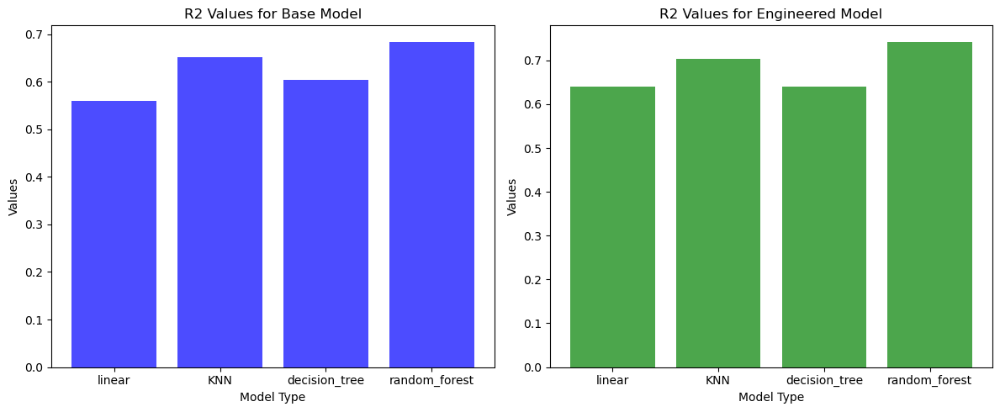

In [40]:
labels = ['linear', 'KNN', 'decision_tree','random_forest']
values1 = [0.5589262820851943, 0.6524804178220722, 0.6033707949000068, 0.6840232858879893]
values2 = [ 0.6392510731215082, 0.703637351001468, 0.6392297296065376, 0.7424093176657885]

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].bar(labels, values1, color='blue', alpha=0.7)
axs[0].set_title('R2 Values for Base Model')
axs[0].set_xlabel('Model Type')
axs[0].set_ylabel('Values')

# Bar plot for the second set of values
axs[1].bar(labels, values2, color='green', alpha=0.7)
axs[1].set_title('R2 Values for Engineered Model')
axs[1].set_xlabel('Model Type')
axs[1].set_ylabel('Values')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

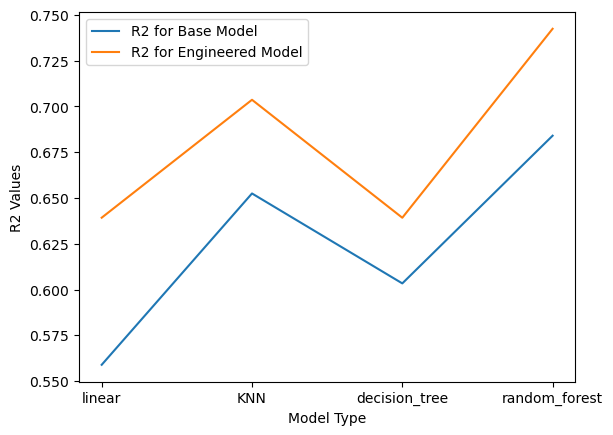

In [41]:
labels = ['linear', 'KNN', 'decision_tree','random_forest']
values1 = [0.5589262820851943, 0.6524804178220722, 0.6033707949000068, 0.6840232858879893]
values2 = [0.6392510731215082, 0.703637351001468, 0.6392297296065376, 0.7424093176657885]

plt.plot(labels, values1, label = "R2 for Base Model") 
plt.plot(labels, values2, label = "R2 for Engineered Model")
plt.xlabel("Model Type")
plt.ylabel("R2 Values")
plt.legend() 
plt.show()